In [101]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score,confusion_matrix,roc_curve,roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
lab_enc=LabelEncoder()

import warnings
warnings.filterwarnings('ignore')

In [102]:
pd.set_option('display.max_rows', None)

In [103]:
data=pd.read_csv('avocadoo.csv')
data.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [104]:
data=data.drop(columns=['Unnamed: 0'])
data=data.drop(columns=['Date'])
data=data.drop(columns=['XLarge Bags'])

In [105]:
data.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,type,year,region
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,conventional,2015,Albany
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,conventional,2015,Albany
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,conventional,2015,Albany
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,conventional,2015,Albany
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,conventional,2015,Albany


In [106]:
data.region.value_counts()

Albany                 338
Sacramento             338
Northeast              338
NorthernNewEngland     338
Orlando                338
Philadelphia           338
PhoenixTucson          338
Pittsburgh             338
Plains                 338
Portland               338
RaleighGreensboro      338
RichmondNorfolk        338
Roanoke                338
SanDiego               338
Atlanta                338
SanFrancisco           338
Seattle                338
SouthCarolina          338
SouthCentral           338
Southeast              338
Spokane                338
StLouis                338
Syracuse               338
Tampa                  338
TotalUS                338
West                   338
NewYork                338
NewOrleansMobile       338
Nashville              338
Midsouth               338
BaltimoreWashington    338
Boise                  338
Boston                 338
BuffaloRochester       338
California             338
Charlotte              338
Chicago                338
C

In [107]:
df=lab_enc.fit_transform(data['region'])
data['region']=df

In [108]:
data.type.value_counts()

conventional    9126
organic         9123
Name: type, dtype: int64

In [109]:
df=lab_enc.fit_transform(data['type'])
data['type']=df

In [110]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AveragePrice  18249 non-null  float64
 1   Total Volume  18249 non-null  float64
 2   4046          18249 non-null  float64
 3   4225          18249 non-null  float64
 4   4770          18249 non-null  float64
 5   Total Bags    18249 non-null  float64
 6   Small Bags    18249 non-null  float64
 7   Large Bags    18249 non-null  float64
 8   type          18249 non-null  int32  
 9   year          18249 non-null  int64  
 10  region        18249 non-null  int32  
dtypes: float64(8), int32(2), int64(1)
memory usage: 1.4 MB


In [111]:
X=data.drop(columns=['AveragePrice'])
y=data['AveragePrice']

In [12]:
X

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,type,year,region
0,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0,2015,0
1,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0,2015,0
2,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0,2015,0
3,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0,2015,0
4,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0,2015,0
5,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0,2015,0
6,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0,2015,0
7,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0,2015,0
8,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0,2015,0
9,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0,2015,0


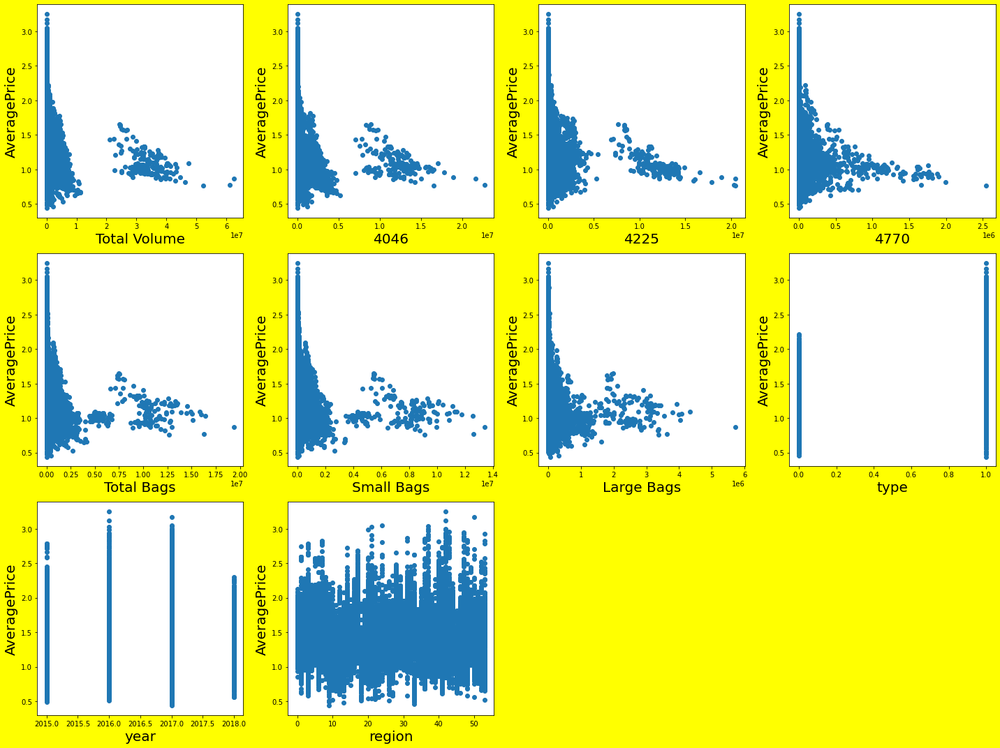

In [112]:
#Lets visualize the dataset and analyze the data
plt.figure(figsize=(20,15), facecolor='yellow')
plotnumber = 1

for column in X:
    if plotnumber<=12:
        ax=plt.subplot(3,4,plotnumber)#Print in 2 rows and 4 columns plotnumer = position
        plt.scatter(X[column],y)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('AveragePrice',fontsize=20)
    plotnumber+=1
plt.tight_layout()

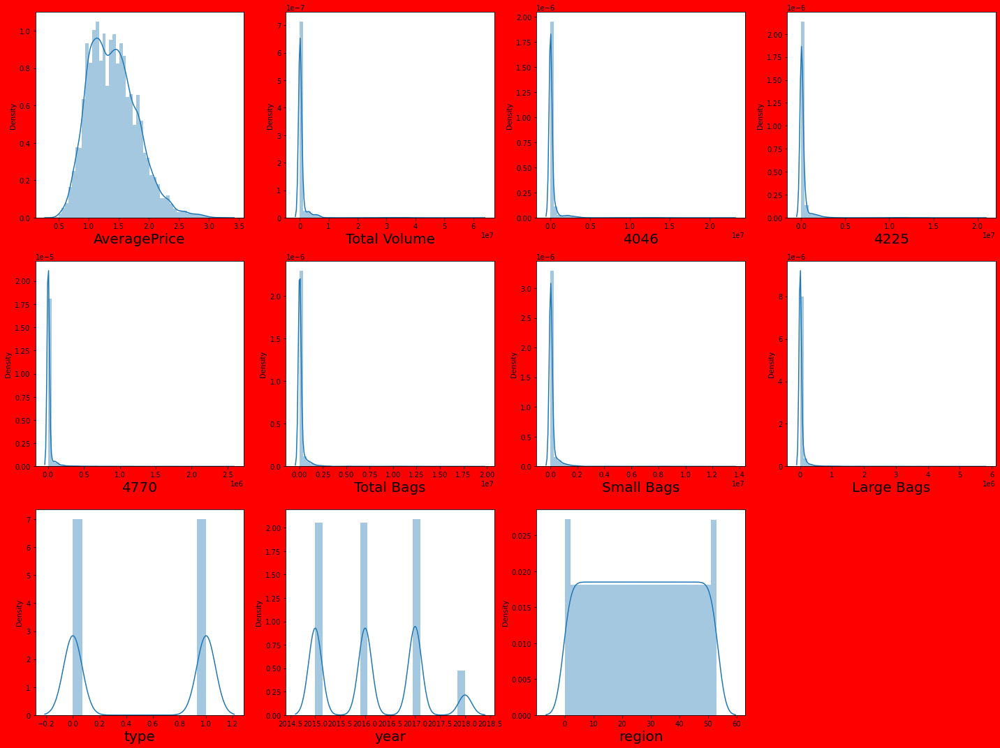

In [113]:
#Lets visualize the dataset and analyze the data
plt.figure(figsize=(20,15), facecolor='red')
plotnumber = 1

for column in data:
    if plotnumber<=12:
        ax=plt.subplot(3,4,plotnumber)#Print in 2 rows and 4 columns plotnumer = position
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

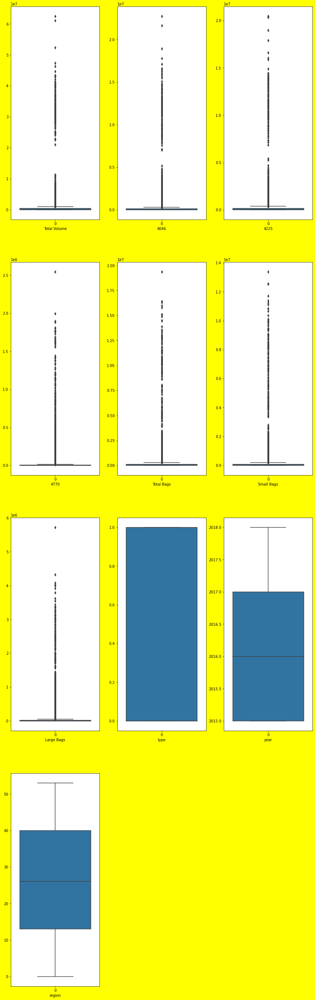

In [114]:
plt.figure(figsize=(15,50), facecolor='yellow')
graph=1

for column in X:
    if graph<=12:
        ax=plt.subplot(4,3,graph)
        #sns.boxplot(df_features[column],orient='v')
        ax=sns.boxplot(data=X[column])
        plt.xlabel(column,fontsize=10)
    graph+=1
plt.show()

In [115]:
data['TotalVolume']=data['Total Volume']
data['TotalBags']=data['Total Bags']
data['LargeBags']=data['Large Bags']
data['SmallBags']=data['Small Bags']
data['A4046']=data['4046']
data['A4225']=data['4225']
data['A4770']=data['4770']

In [116]:
data.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [ ]:
data=data.drop(columns=['Total Volume'])
data=data.drop(columns=['Total Bags'])
data=data.drop(columns=['Large Bags'])
data=data.drop(columns=['Small Bags'])
data=data.drop(columns=['4046'])
data=data.drop(columns=['4225'])
data=data.drop(columns=['4770'])

In [120]:
data.head()

,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [121]:
data.head()

,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [122]:
new_data=data

In [123]:
A=new_data.drop(columns=['AveragePrice'])
b=new_data['AveragePrice']

In [124]:
#1st quantile for the whole data set / for all the features we will get it
q1=new_data.quantile(0.25)

#3rd Quantile
q3=new_data.quantile(0.75)

iqr=q3-q1

In [125]:
Total_Volume_high=q3.TotalVolume +(1.5*iqr.TotalVolume)
Total_Volume_high

1066147.855

In [126]:
A4046_high=q3.A4046 +(1.5*iqr.A4046)
A4046_high

276269.39499999996

In [127]:
A4225_high=q3.A4225 +(1.5*iqr.A4225)
A4225_high

371003.98

In [128]:
A4770_high=q3.A4770 +(1.5*iqr.A4770)
A4770_high

15608.550000000001

In [129]:
TotalBags_high=q3.TotalBags +(1.5*iqr.TotalBags)
TotalBags_high

269325.46499999997

In [130]:
SmallBags_high=q3.SmallBags +(1.5*iqr.SmallBags)
SmallBags_high

204070.04499999998

In [131]:
LargeBags_high=q3.LargeBags +(1.5*iqr.LargeBags)
LargeBags_high

54881.92

In [132]:
index=np.where(new_data['LargeBags']> LargeBags_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [133]:
index=np.where(new_data['SmallBags']> SmallBags_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [134]:
index=np.where(new_data['TotalBags']> TotalBags_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [135]:
index=np.where(new_data['A4770']> A4770_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [136]:
index=np.where(new_data['A4225']> A4225_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [137]:
index=np.where(new_data['TotalVolume']> Total_Volume_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [97]:
new_data.reset_index()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78
3,5,1.26,0,2015,0,55979.78,6683.91,127.44,6556.47,1184.27,48067.99,43.61
4,36,1.19,0,2015,0,49064.73,14301.92,698.95,13602.97,774.15,33941.51,47.15
5,37,1.13,0,2015,0,48364.29,17104.37,665.88,16438.49,864.27,30374.15,21.50
6,51,1.22,0,2015,0,40873.28,9716.46,529.53,9186.93,2819.50,28287.42,49.90
7,2548,1.36,0,2015,49,42344.22,17940.65,0.00,17940.65,828.65,23560.51,14.41
8,2549,1.36,0,2015,49,39365.15,16474.25,0.00,16474.25,646.68,22231.33,12.89
9,2550,1.32,0,2015,49,50384.57,16455.23,0.00,16455.23,773.81,33149.83,5.70


In [138]:
A=new_data.drop(columns=['AveragePrice'])
b=new_data['AveragePrice']

In [142]:
new_data.head(50)

,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78
5,1.26,0,2015,0,55979.78,6683.91,127.44,6556.47,1184.27,48067.99,43.61
6,0.99,0,2015,0,83453.76,8318.86,122.05,8196.81,1368.92,73672.72,93.26
7,0.98,0,2015,0,109428.33,6829.22,562.37,6266.85,703.75,101815.36,80.00
8,1.02,0,2015,0,99811.42,11388.36,283.83,11104.53,1022.15,87315.57,85.34
9,1.07,0,2015,0,74338.76,8625.92,564.45,8061.47,842.40,64757.44,113.00


In [143]:
A.head()

,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


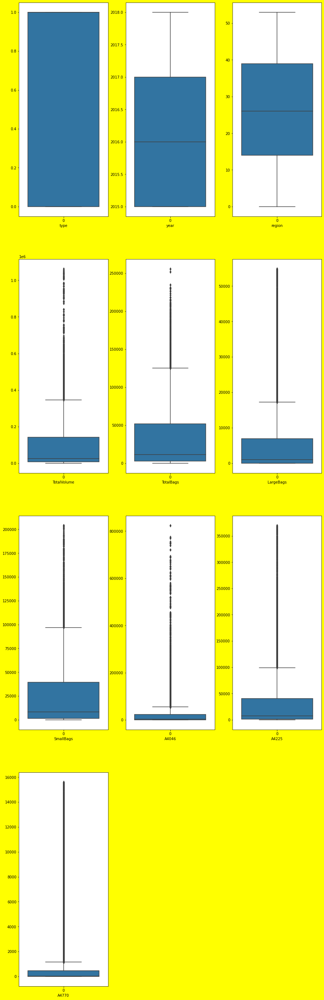

In [141]:
plt.figure(figsize=(15,50), facecolor='yellow')
graph=1

for column in A:
    if graph<=12:
        ax=plt.subplot(4,3,graph)
        #sns.boxplot(df_features[column],orient='v')
        ax=sns.boxplot(data=A[column])
        plt.xlabel(column,fontsize=10)
    graph+=1
plt.show()

In [144]:
#1st quantile for the whole data set / for all the features we will get it
q1=new_data.quantile(0.25)

#3rd Quantile
q3=new_data.quantile(0.75)

iqr=q3-q1

In [145]:
Total_Volume_high=q3.TotalVolume +(1.5*iqr.TotalVolume)
print('Total_Volume_high =',Total_Volume_high)
A4046_high=q3.A4046 +(1.5*iqr.A4046)
print('A4046_high =',A4046_high)
A4225_high=q3.A4225 +(1.5*iqr.A4225)
print('A4225_high =',A4225_high)
A4770_high=q3.A4770 +(1.5*iqr.A4770)
print('A4770_high =',A4770_high)
TotalBags_high=q3.TotalBags +(1.5*iqr.TotalBags)
print('TotalBags_high =',TotalBags_high)
SmallBags_high=q3.SmallBags +(1.5*iqr.SmallBags)
print('SmallBags_high =',SmallBags_high)
LargeBags_high=q3.LargeBags +(1.5*iqr.LargeBags)
print('LargeBags_high =',LargeBags_high)


Total_Volume_high = 346748.015
A4046_high = 54736.835
A4225_high = 99419.17
A4770_high = 1160.7250000000001
TotalBags_high = 125053.25
SmallBags_high = 96955.785
LargeBags_high = 17240.199999999997


In [146]:
index=np.where(new_data['LargeBags']> LargeBags_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [147]:
index=np.where(new_data['SmallBags']> SmallBags_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [148]:
index=np.where(new_data['TotalBags']> TotalBags_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,2,0.93,0,2015,0,118220.22,8145.35,103.14,8042.21,794.70,109149.67,130.50
3,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78


In [154]:
index=np.where(new_data['A4770']> A4770_high)

new_data=new_data.drop(new_data.index[index])
print(new_data.index[index])

new_data.reset_index().head()

Int64Index([], dtype='int64')


,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
3,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78
4,5,1.26,0,2015,0,55979.78,6683.91,127.44,6556.47,1184.27,48067.99,43.61


In [150]:
index=np.where(new_data['A4225']> A4225_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
3,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78
4,5,1.26,0,2015,0,55979.78,6683.91,127.44,6556.47,1184.27,48067.99,43.61


In [151]:
index=np.where(new_data['TotalVolume']> Total_Volume_high)

new_data=new_data.drop(new_data.index[index])
new_data.reset_index().head()

,index,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
2,3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
3,4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78
4,5,1.26,0,2015,0,55979.78,6683.91,127.44,6556.47,1184.27,48067.99,43.61


In [152]:
A=new_data.drop(columns=['AveragePrice'])
b=new_data['AveragePrice']

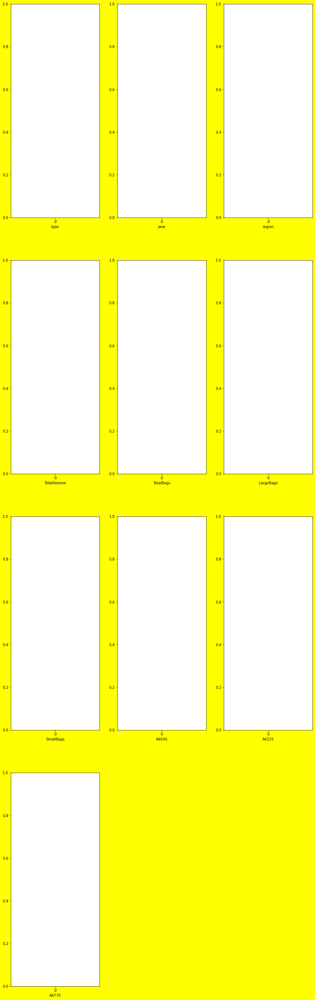

In [156]:
plt.figure(figsize=(15,50), facecolor='yellow')
graph=1

for column in A:
    if graph<=12:
        ax=plt.subplot(4,3,graph)
        #sns.boxplot(df_features[column],orient='v')
        ax=sns.boxplot(new_data=A[column])
        plt.xlabel(column,fontsize=10)
    graph+=1
plt.show()

In [82]:
#1st quantile for the whole data set / for all the features we will get it
q1=new_data.quantile(0.25)

#3rd Quantile
q3=new_data.quantile(0.75)

iqr=q3-q1

In [83]:
Total_Volume_high=q3.TotalVolume +(1.5*iqr.TotalVolume)
print('Total_Volume_high =',Total_Volume_high)
A4046_high=q3.A4046 +(1.5*iqr.A4046)
print('A4046_high =',A4046_high)
A4225_high=q3.A4225 +(1.5*iqr.A4225)
print('A4225_high =',A4225_high)
A4770_high=q3.A4770 +(1.5*iqr.A4770)
print('A4770_high =',A4770_high)
TotalBags_high=q3.TotalBags +(1.5*iqr.TotalBags)
print('TotalBags_high =',TotalBags_high)
SmallBags_high=q3.SmallBags +(1.5*iqr.SmallBags)
print('SmallBags_high =',SmallBags_high)
LargeBags_high=q3.LargeBags +(1.5*iqr.LargeBags)
print('LargeBags_high =',LargeBags_high)

Total_Volume_high = 66185.4975
A4046_high = 9729.717499999999
A4225_high = 23938.17
A4770_high = 81.75
TotalBags_high = 30339.182500000003
SmallBags_high = 25683.977499999997
LargeBags_high = 4942.967500000001


In [84]:
index=np.where(new_data['LargeBags']> LargeBags_high)

new_data=new_data.drop(new_data.index[index])

In [85]:
index=np.where(new_data['SmallBags']> SmallBags_high)

new_data=new_data.drop(new_data.index[index])

In [86]:
index=np.where(new_data['TotalBags']> TotalBags_high)

new_data=new_data.drop(new_data.index[index])

In [87]:
index=np.where(new_data['A4770']> A4770_high)

new_data=new_data.drop(new_data.index[index])

In [ ]:
index=np.where(new_data['A4225']> A4225_high)

new_data=new_data.drop(new_data.index[index])

In [89]:
index=np.where(new_data['TotalVolume']> Total_Volume_high)

new_data=new_data.drop(new_data.index[index])

In [88]:
index=np.where(new_data['A4046']> A4046_high)

new_data=new_data.drop(new_data.index[index])

In [90]:
A=new_data.drop(columns=['AveragePrice'])
b=new_data['AveragePrice']

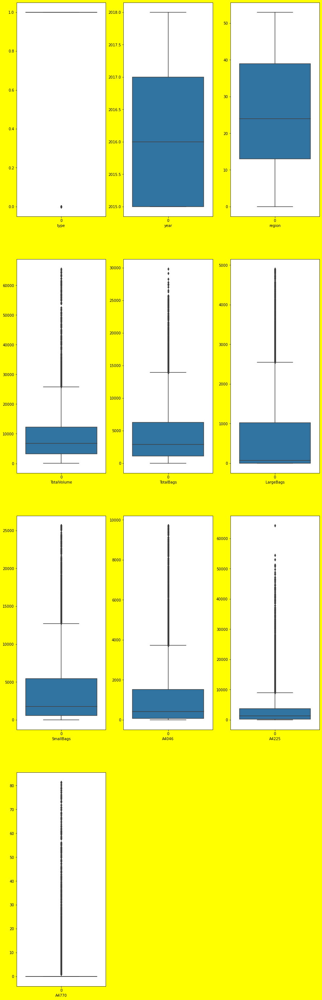

In [91]:
plt.figure(figsize=(15,50), facecolor='yellow')
graph=1

for column in A:
    if graph<=12:
        ax=plt.subplot(4,3,graph)
        #sns.boxplot(df_features[column],orient='v')
        ax=sns.boxplot(data=A[column])
        plt.xlabel(column,fontsize=10)
    graph+=1
plt.show()

In [157]:
scaler=StandardScaler()#instantiate inot object
X_scaled=scaler.fit_transform(A)

In [158]:
x_train,x_test,y_train,y_test=train_test_split(X_scaled,b,test_size=0.25,random_state=49)   #feature then label and random state is kept for just checking the randomness
y_train.head()

11765    1.73
17263    1.48
260      1.35
13741    1.20
15415    0.89
Name: AveragePrice, dtype: float64

In [159]:
b.head()

0    1.33
1    1.35
3    1.08
4    1.28
5    1.26
Name: AveragePrice, dtype: float64

In [160]:
regression=LinearRegression()
regression.fit(x_train,y_train)

LinearRegression()

In [162]:
new_data.head()

,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
0,1.33,0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16
1,1.35,0,2015,0,54876.98,9505.56,97.49,9408.07,674.28,44638.81,58.33
3,1.08,0,2015,0,78992.15,5811.16,133.76,5677.40,1132.00,71976.41,72.58
4,1.28,0,2015,0,51039.60,6183.95,197.69,5986.26,941.48,43838.39,75.78
5,1.26,0,2015,0,55979.78,6683.91,127.44,6556.47,1184.27,48067.99,43.61


In [164]:
new_data.tail()

,AveragePrice,type,year,region,TotalVolume,TotalBags,LargeBags,SmallBags,A4046,A4225,A4770
18244,1.63,1,2018,53,17074.83,13498.67,431.85,13066.82,2046.96,1529.20,0.00
18245,1.71,1,2018,53,13888.04,9264.84,324.80,8940.04,1191.70,3431.50,0.00
18246,1.87,1,2018,53,13766.76,9394.11,42.31,9351.80,1191.92,2452.79,727.94
18247,1.93,1,2018,53,16205.22,10969.54,50.00,10919.54,1527.63,2981.04,727.01
18248,1.62,1,2018,53,17489.58,12014.15,26.01,11988.14,2894.77,2356.13,224.53


In [163]:
print('AveragePrice',regression.predict(scaler.transform([[0,2015,0,64236.62,8696.87,93.25,8603.62,1036.74,54454.85,48.16]])))

AveragePrice [1.37726434]


In [166]:
import pickle

In [167]:
#saving the model in local file system
filename= 'Avocado_finalized_model.pickle'
pickle.dump(regression,open(filename,'wb'))

#prediciton using saved model
loaded_model=pickle.load(open(filename,'rb'))

a=loaded_model.predict(scaler.transform([[1,2018,53,17074,13498.67,431.85,13066.82,2046.96,1529.20,0.00]]))

a

array([1.79945061])

In [168]:
regression.score(x_train,y_train)

0.20981350416443478

In [169]:
regression.score(x_test,y_test)

0.22022598250247993

In [170]:
y_pred=regression.predict(x_test)

In [172]:
y_pred

array([1.57959133, 1.77276354, 1.68620224, ..., 1.69595698, 1.74724159,
       1.62416789])

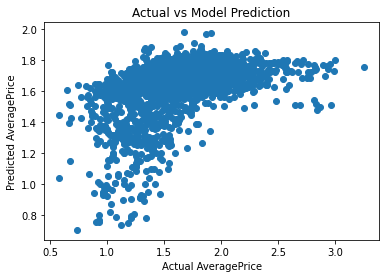

In [173]:
plt.scatter(y_test,y_pred)
plt.xlabel('Actual AveragePrice')
plt.ylabel('Predicted AveragePrice')
plt.title('Actual vs Model Prediction')
plt.show()

In [ ]:
Now here region will be predicting

In [174]:
C=new_data.drop(columns=['region'])
d=new_data['region']

In [175]:
scalar=StandardScaler()
C_scaled=scalar.fit_transform(C)

In [176]:
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(C_scaled,i) for i in range(C_scaled.shape[1])]
vif['features']=C.columns

vif

,vif,features
0,1.259426e+00,AveragePrice
1,2.469412e+00,type
2,1.196185e+00,year
3,1.072394e+07,TotalVolume
4,1.786748e+06,TotalBags
5,2.936530e+01,LargeBags
6,8.107993e+02,SmallBags
7,2.382545e+06,A4046
8,1.287300e+06,A4225
9,1.699664e+02,A4770


In [ ]:
No collinearity exist as there is vif<5

In [177]:
x_train,x_test,y_train,y_test=train_test_split(C_scaled,d,test_size=0.25,random_state=355)

In [178]:
log_reg=LogisticRegression()

log_reg.fit(x_train,y_train)

LogisticRegression()

In [179]:
y_pred=log_reg.predict(x_test)

In [180]:
y_pred

array([30, 44, 23, ..., 14, 27, 30])

In [181]:
accuracy=accuracy_score(y_test,y_pred)
accuracy

0.41996481970096744

In [182]:
conf_mat=confusion_matrix(y_test,y_pred)
conf_mat

array([[30,  0,  0, ...,  0,  0,  0],
       [ 1,  6,  0, ...,  1,  0,  0],
       [ 0,  0, 21, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ...,  1,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  4,  1, ...,  1,  0,  2]], dtype=int64)

In [184]:
from sklearn.metrics import classification_report

In [185]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.54      0.38      0.44        80
           1       0.18      0.16      0.17        38
           2       0.81      0.55      0.66        38
           3       0.18      0.10      0.13        41
           4       0.70      0.36      0.47        45
           5       0.45      0.33      0.38        70
           6       0.97      0.97      0.97        36
           7       0.86      0.73      0.79        52
           8       0.81      0.96      0.88        45
           9       0.43      0.48      0.45        46
          10       0.50      0.04      0.08        46
          11       0.37      0.38      0.37        47
          12       0.44      0.21      0.29        33
          13       0.32      0.17      0.22        41
          14       0.19      0.45      0.27        44
          15       0.88      0.78      0.82        18
          16       0.21      0.08      0.11        51
          17       0.34    